## Table of Content

- [1.0 - Packages](#1.0)
- [2.0 - Objective](#2.0)
- [3.0 - Data Preprocessing](#3.0)
- [4.0 - Data Exploration](#4.0)
    - [4.1 - Class Distribution](#4-1)
    - [4.2 - Accuracy of Masked Images](#4-2)
    - [4.3 - Variability of Images](#4-3)
- [5.0 - Analysis and Recommendation](#5.0)
    - [5.1 - Class Distribution](#5-1)
    - [5.2 - Accuracy of Mask vs Actual Item](#5-2)
    - [5.3 - Variability of Images](#5-3)
    - [5.4 - Recommendations](#5-4)

<a name='1.0'></a>
#### 1.0 Packages

In [1]:
import os, cv2
import numpy as np
import pandas as pd
import random, tqdm
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.patheffects as path_effects
from matplotlib.patches import Patch
import seaborn as sns
import random
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import albumentations as album
import segmentation_models_pytorch as smp
from segmentation_models_pytorch import utils

from segm_utils import visualize, one_hot_encode, reverse_one_hot, color_code_segmentation, get_training_augmentation, get_validation_augmentation, to_tensor, get_preprocessing, visualize_norm

<a name='2.0'></a>
### 2.0 OBJECTIVE

This is the first part of the 2 part series in the Feature Extraction process. The objective of this project is extract features of fashion or clothing related items/classes to further process into a recommender system. The 2 part consist of the following:
* Exploratory Data Analysis of Dataset (this notebook): analyze publicly available dataset to see whether it can be used for feature extraction. Many available datasets have already been labelled with its respective classes. In this notebook, I'll analyze the dataset by looking at class distribution, making sure that masks or labeled data is consistent and correct, I'll further look at the variability of the dataset to see if the data provide enough examples or scaling for the model to learn from. I will also provide findings and recommendations on the dataset at the end of this notebook.

* Model Training and Analysis: Using this dataset, I'll perform an image segmentation model training, choose the appropriate model architecture, hyperparameters, loss function, metric, and run the model. I'll be using the UNet model for this project.

To understand the objective of this project, let's take a look at an example of this original image and ground truth mask pair. Each image that's processed into the model will return a prediction mask, each mask is color coded with RGB colors and has its own class associated with it. an image grid of the class color chart can be seen at section 4.2 of this notebook.

I will be using an original image and ground truth mask pair to extract fashion class features for the purpose of this example. Let's load our image/mask pair:

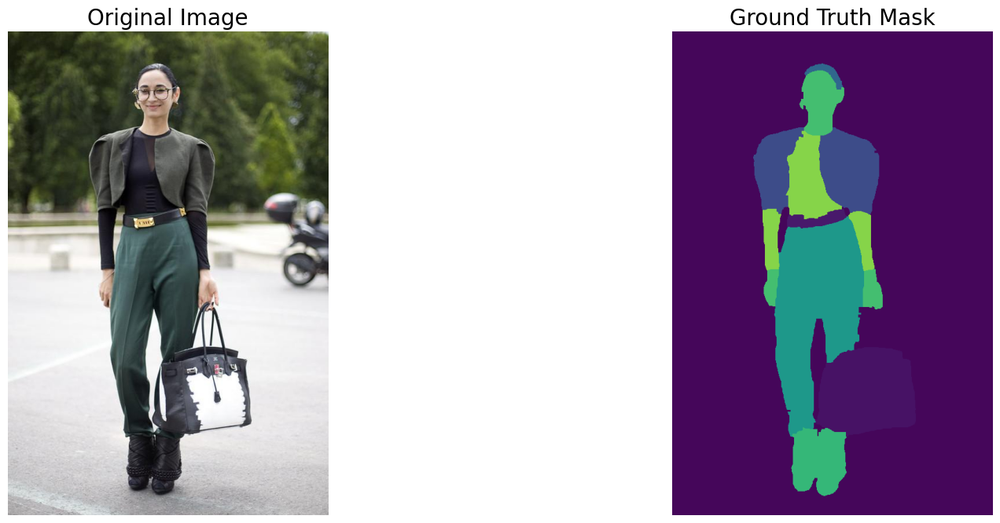

In [121]:
# Load image and its respective mask
image_board = cv2.imread('outfit/0013.jpg')
mask_board = cv2.imread('outfit/0013.png')

# Convert image and mask to RGB format
image_board = cv2.cvtColor(image_board, cv2.COLOR_BGR2RGB)
mask_board = cv2.cvtColor(mask_board, cv2.COLOR_BGR2RGB)

# Create a figure with multiple subplots
fig, axs = plt.subplots(1, 2, figsize=(20, 8))

# Plot the original image
axs[0].imshow(image_board)
axs[0].set_title("Original Image", fontsize=20)
axs[0].axis('off')

# Plot the ground truth mask
axs[1].imshow(mask_board)
axs[1].set_title("Ground Truth Mask", fontsize=20)
axs[1].axis('off')

plt.show()

Below, I have a created a board using the image/mask pair above. Once I have a satisficing dataset and model that can provide good result. I can use this model to create fashion boards through images to further process into a recommender system.

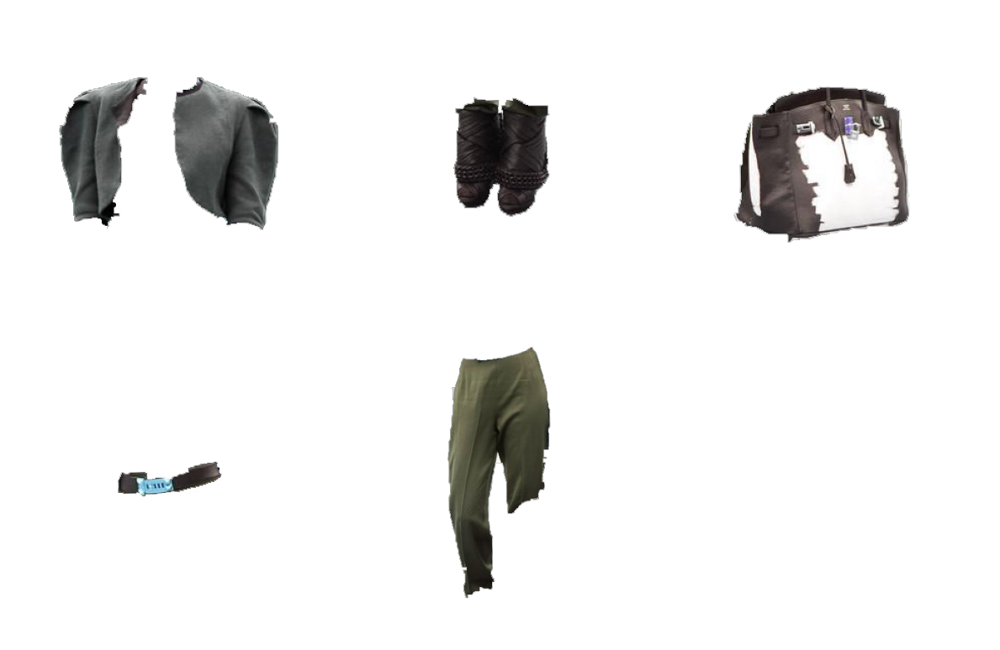

In [119]:
# Path to the folder containing the images
folder_path = 'outfit/board/'

# List all files in the folder
image_files = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]

# Create a subplot grid based on the number of images
num_images = len(image_files)
num_cols = 3  # Number of columns in the grid
num_rows = (num_images + num_cols - 1) // num_cols  # Calculate the number of rows

# Create a new figure with the desired dimensions
fig, axs = plt.subplots(num_rows, num_cols, figsize=(12, 8))

# Iterate through the images and plot them
for i, image_file in enumerate(image_files):
    # Load the image
    image_path = os.path.join(folder_path, image_file)
    img = mpimg.imread(image_path)
    
    # Calculate the row and column index for this image
    row = i // num_cols
    col = i % num_cols
    
    # Plot the image in the appropriate subplot
    axs[row, col].imshow(img)
    axs[row, col].axis('off')

# Remove empty subplots if there are fewer images
if num_images < (num_rows * num_cols):
    for i in range(num_images, num_rows * num_cols):
        fig.delaxes(axs.flatten()[i])

# Adjust the layout to ensure proper spacing
plt.tight_layout()

# Show or save the final image
plt.show()

<a name='3.0'></a>
### 3.0 Data Preprocessing

In [2]:
DATA_DIR = 'archive'
metadata_df = pd.read_csv(os.path.join(DATA_DIR, 'metadata.csv'))
metadata_df = metadata_df[['image_path', 'label_type', 'label_path']]
metadata_df['image_path'] = metadata_df['image_path'].apply(lambda img_pth: os.path.join(DATA_DIR, img_pth))
metadata_df['label_path'] = metadata_df['label_path'].apply(lambda lbl_pth: os.path.join(DATA_DIR, 'labels', lbl_pth))

# select data subset with pixel-level annotations (ignoring image-level annotations)
metadata_df = metadata_df[metadata_df['label_type']=='pixel-level']

# Shuffle DataFrame
metadata_df = metadata_df.sample(frac=1).reset_index(drop=True)

In [3]:
class_dict = pd.read_csv(os.path.join(DATA_DIR, 'class_dict.csv'))

# Get class names
class_names = class_dict['class_name'].tolist()

# Re-writing 'null' class to prevent a NaN value
class_names[0] = 'null'

# Get class RGB values
class_rgb_values = class_dict[['r', 'g', 'b']].values.tolist()

In [9]:
# Get RGB values of required classes
class_indices = [class_names.index(cls.lower()) for cls in class_names]
class_rgb_values = np.array(class_rgb_values)[class_indices]
class_dict.loc[0, 'class_name'] = 'null'

In [78]:
class_dict.head()

,class_name,r,g,b
0,null,69,6,90
1,accessories,70,12,95
2,bag,71,18,101
3,belt,72,25,107
4,blazer,72,30,112


In [5]:
class ClothesDataset(torch.utils.data.Dataset):
    """
    Clothes co-parsing dataset. read images, apply augmentation and preprocessing transformations.
    Args:
        df(str): DataFrame containing images/labels paths
        class_rgb_values (list): RGB values of select classes to extract from segmentation mask
        augmentation (albumentations.Compose): data transformation pipeline.
            e.g., flip, scale, etc
        preprocessing (albumentations.Compose): data preprocessing
            e.g., normalization, shape manipulation, etc.
    """
    def __init__(
        self,
        df,
        class_rgb_values=None,
        augmentation=None,
        preprocessing=None
    ):
        self.image_paths = df['image_path'].tolist()
        self.mask_paths = df['label_path'].tolist()
        self.class_rgb_values = class_rgb_values
        self.augmentation = augmentation
        self.preprocessing = preprocessing

    def __getitem__(self, i):
        # read images and masks
        image = cv2.imread(self.image_paths[i])[:,:,::-1]
        mask = cv2.imread(self.mask_paths[i])[:,:,::-1]

        # one-hot-encode the mask
        mask = one_hot_encode(mask, self.class_rgb_values).astype('float')

        # apply augmentations
        if self.augmentation:
            sample = self.augmentation(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']

        # apply preprocessing
        if self.preprocessing:
            sample = self.preprocessing(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']

        return image, mask

    def __len__(self):
        # return length of
        return len(self.image_paths)

In [12]:
# Create a dictionary to store class counts
class_counts = {class_name: 0 for class_name in class_names}

In [14]:
# Create Class Counts dataframe for data exploration

# Iterate through the dataset
for _, row in metadata_df.iterrows():
    # Load the mask image
    mask = cv2.imread(row['label_path'])[:, :, ::-1]

    # Iterate through the unique class RGB values in the mask
    unique_class_rgb_values = np.unique(mask.reshape(-1, 3), axis=0)
    
    # Iterate through the unique class RGB values and count them as one
    for rgb_value in unique_class_rgb_values:
        rgb_value = rgb_value.tolist()
        class_name = class_names[class_rgb_values.tolist().index(rgb_value)]
        class_counts[class_name] += 1

# Convert the class counts dictionary to a DataFrame
class_counts_df = pd.DataFrame.from_dict(class_counts, orient='index', columns=['Count'])

# Calculate class frequency
class_counts_df['Frequency'] = round(class_counts_df['Count'] / class_counts_df['Count'].sum() * 100, 2)
class_counts_df['Frequency'] = class_counts_df['Frequency'].astype(str) + '%'

# Sort the DataFrame by count
class_counts_df = class_counts_df.sort_values(by='Count', ascending=False)

In [ ]:
# Give ClassId a column index and export to csv
class_counts_df.index.name = 'ClassId'
class_counts_df.reset_index(inplace=True)
class_counts_df.to_csv('class_counts.csv', index=False)

<a name='4.0'></a>
### 4.0 Data Exploration

<a name='4-1'></a>
#### 4.1 Class Distribution

In [26]:
total_training_examples = metadata_df.shape[0]
print("Total number of training examples:", total_training_examples)

Total number of training examples: 1004


In [25]:
# Let's look at the top 5 class that appears the most

class_counts_df.head()

,ClassId,Count,Frequency
0,null,1004,12.14%
1,skin,1003,12.12%
2,hair,960,11.6%
3,shoes,775,9.37%
4,bag,443,5.35%


In [128]:
# Let's also look at the top 5 classes that appears the least

least_amt_class = class_counts_df.sort_values(by='Count', ascending=True)

least_amt_class.head()


,ClassId,Count,Frequency
58,panties,0,0.0%
55,swimwear,0,0.0%
57,intimate,0,0.0%
56,clogs,0,0.0%
54,earrings,1,0.01%


Let's also look at how many class items appear in each image, I'll be looking at both the median and mean of the dataset

In [133]:
# Calculate the mean of the "Count" column
mean_count = class_counts_df['Count'].mean()

# Calculate the median of the "Count" column
median_count = class_counts_df['Count'].median()

print("Mean Count:", mean_count)
print("Median Count:", median_count)

Mean Count: 140.22033898305085
Median Count: 57.0


In [125]:
# Define whether to exclude the first class or not
exclude_first_class = True

# Create a list to store the class counts for each image
image_class_counts = []

# Iterate through the dataset
for _, row in metadata_df.iterrows():
    # Load the mask image
    mask = cv2.imread(row['label_path'])[:, :, ::-1]

    # Iterate through the unique class RGB values in the mask
    unique_class_rgb_values = np.unique(mask.reshape(-1, 3), axis=0)

    # Initialize a count for classes in the current image
    image_class_count = 0
    
    # Iterate through the unique class RGB values and count them as one
    for rgb_value in unique_class_rgb_values:
        rgb_value = rgb_value.tolist()
        class_name = class_names[class_rgb_values.tolist().index(rgb_value)]
        
        # Exclude the first class (class_rgb_values[0]) if needed
        if exclude_first_class and class_name == class_names[0]:
            continue
        
        # Increment the class count for the current image
        image_class_count += 1

    # Append the class count to the list
    image_class_counts.append(image_class_count)

# Calculate the median and mean/average class count
median_class_count = np.median(image_class_counts)
mean_class_count = np.mean(image_class_counts)

# Convert the list of class counts into a DataFrame
image_class_counts_df = pd.DataFrame({'ClassCount': image_class_counts})

# Print the median and mean of the class counts per image
print(f"Median Class Count: {median_class_count}")
print(f"Mean Class Count: {mean_class_count}")


Median Class Count: 7.0
Mean Class Count: 7.24003984063745


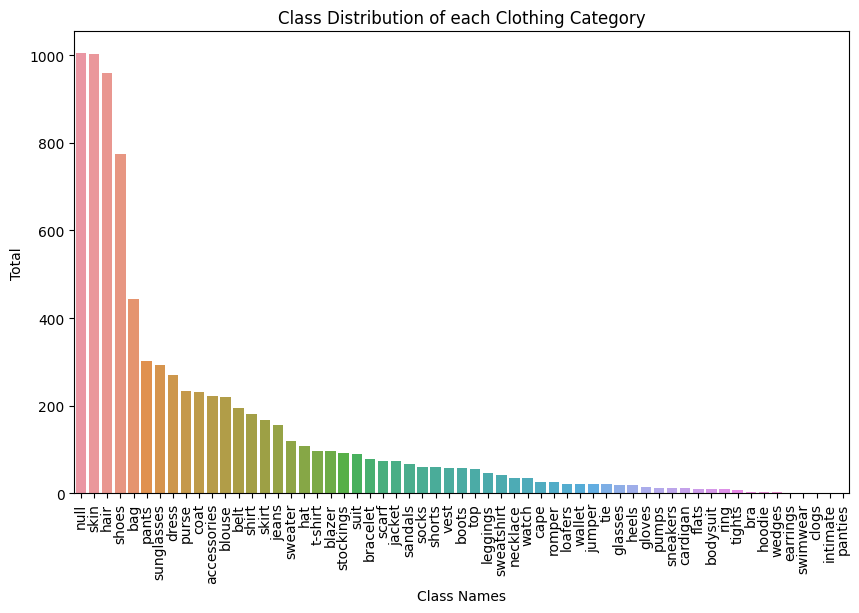

In [123]:
# Plot figure to see the class distribution in the dataset

plt.figure(figsize=(10, 6))
sns.barplot(data=class_counts_df, x='ClassId', y='Count')
plt.xlabel('Class Names')
plt.ylabel('Total')
plt.title('Class Distribution of each Clothing Category')
plt.xticks(rotation=90)  # Rotate x-axis labels for readability
plt.show()


<a name='4-2'></a>
#### 4.2 Accuracy of Masked Images

First, let's see what mask color and its respective categories are present in this dataset

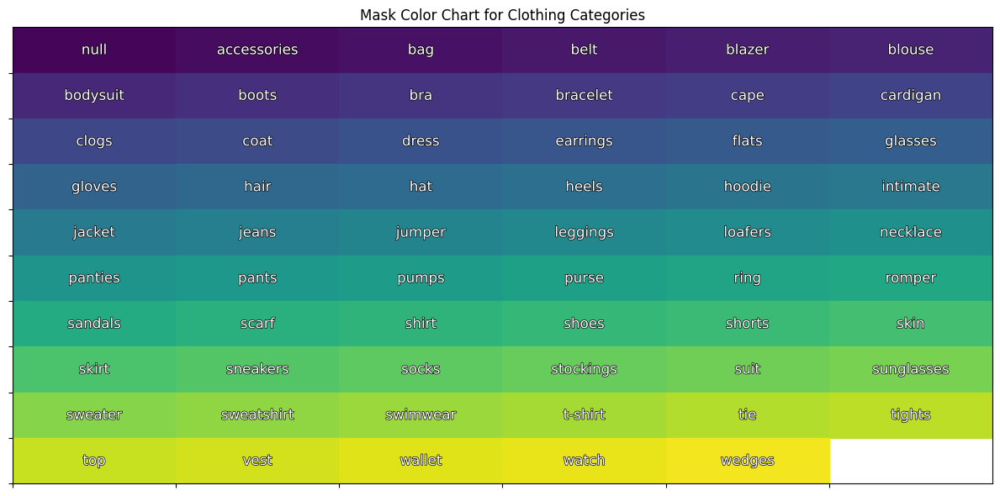

In [91]:
# Visualize the class_name or categories to their respective mask RGB color for further processing

# Create a figure and axis
fig, ax = plt.subplots(figsize=(12, 6))

# Calculate the number of rows needed based on the maximum classes per row (6)
num_rows = len(class_dict) // 6 + (len(class_dict) % 6 > 0)

# Iterate over rows and plot colored rectangles with class names
for row_num in range(num_rows):
    for col_num in range(6):
        index = row_num * 6 + col_num
        if index >= len(class_dict):
            break
        row = class_dict.iloc[index]
        color = np.array([row['r'], row['g'], row['b']]) / 255.0
        ax.add_patch(plt.Rectangle((col_num, num_rows - row_num - 1), 1, 1, color=color))
        text = ax.text(col_num + 0.5, num_rows - row_num - 0.5, row['class_name'], ha='center', va='center', fontsize=12, color='white')
        text.set_path_effects([path_effects.Stroke(linewidth=1, foreground='black'), path_effects.Normal()])

# Set axis limits and labels
ax.set_xlim(0, 6)
ax.set_ylim(0, num_rows)
ax.set_xticks(range(6))
ax.set_xticklabels([])
ax.set_yticks(range(num_rows))
ax.set_yticklabels([])

# Set title and display the color chart
ax.set_title("Mask Color Chart for Clothing Categories")
plt.tight_layout()
plt.show()

##### Visualize the Original Image, the Ground Truth Mask, and the class legend with its respective RGB color

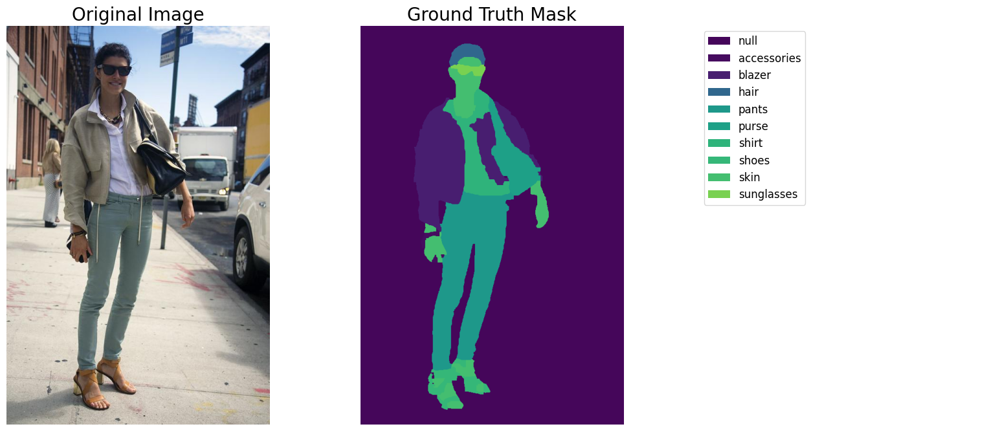

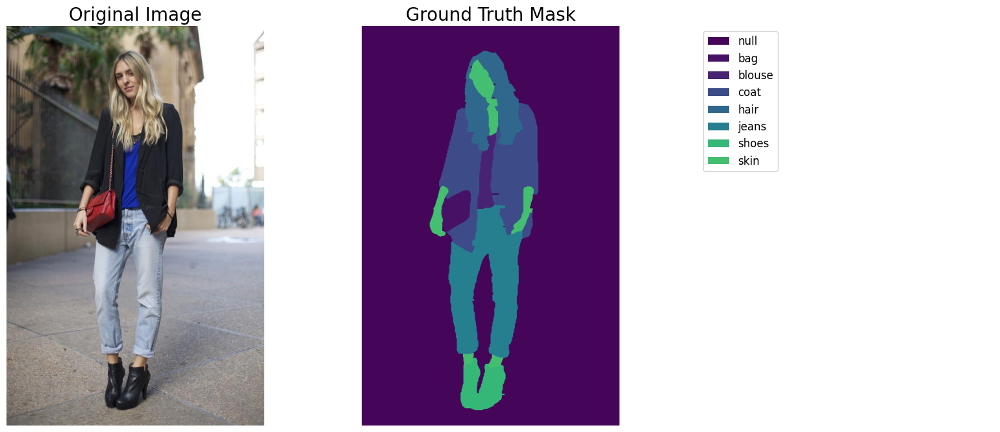

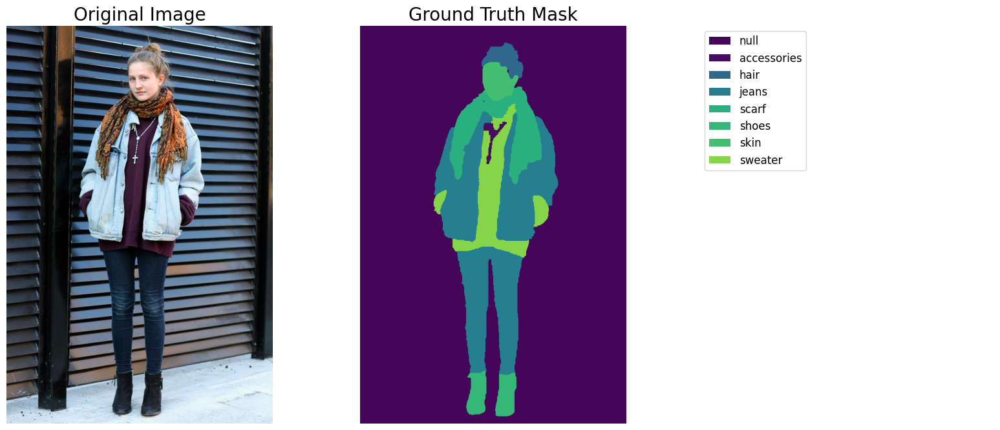

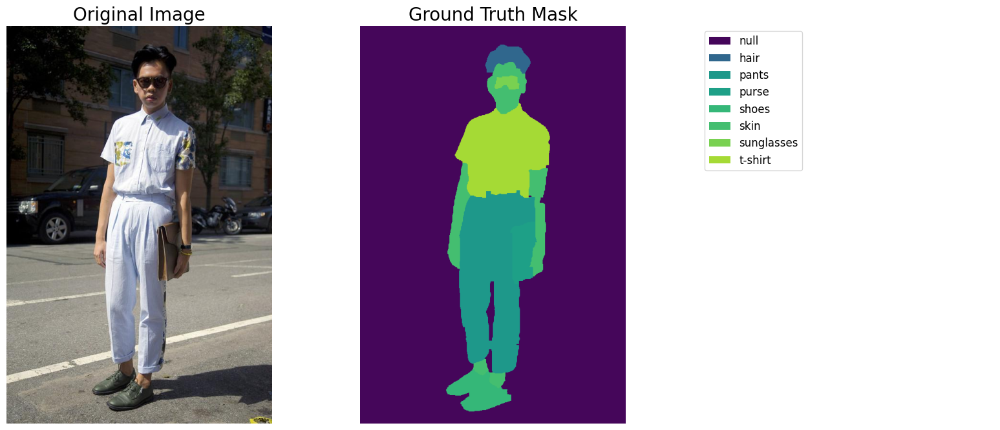

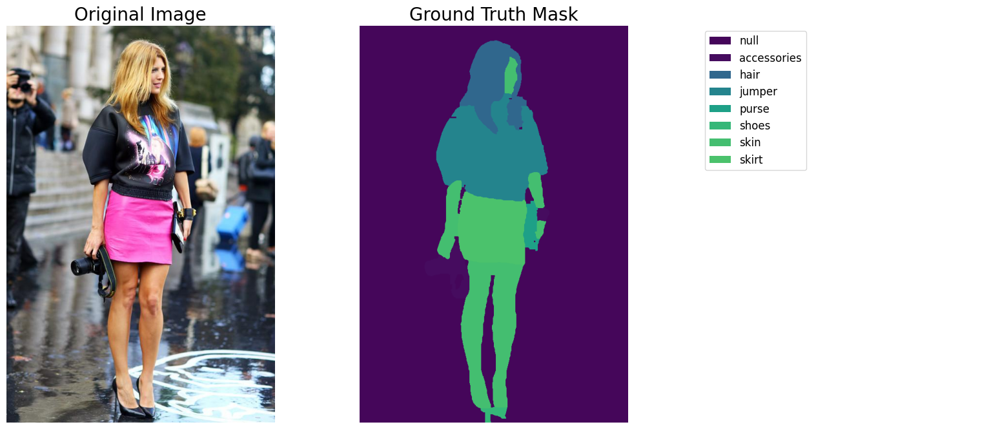

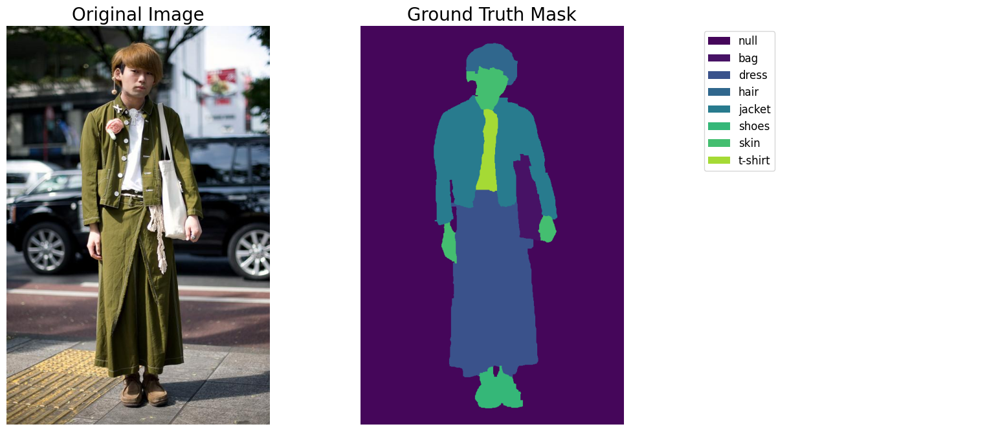

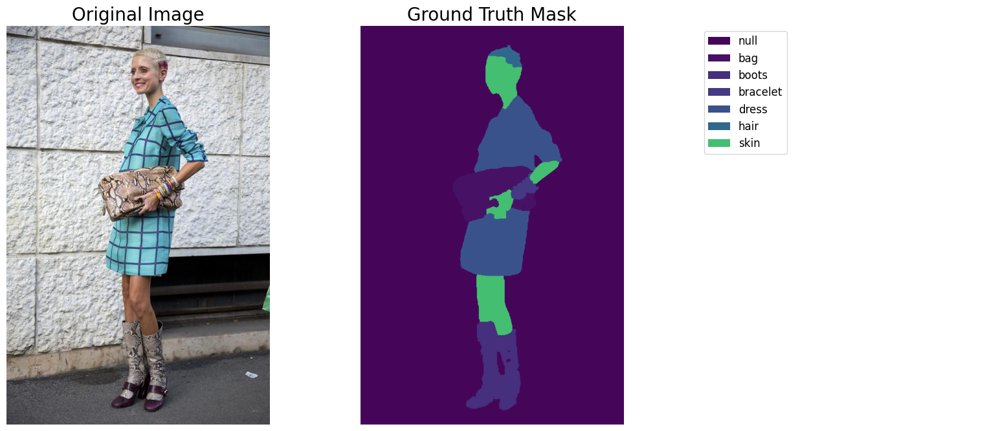

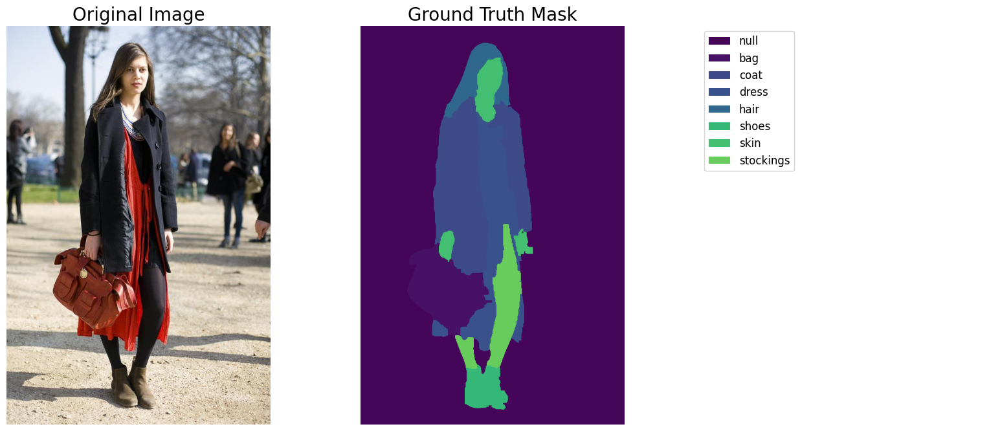

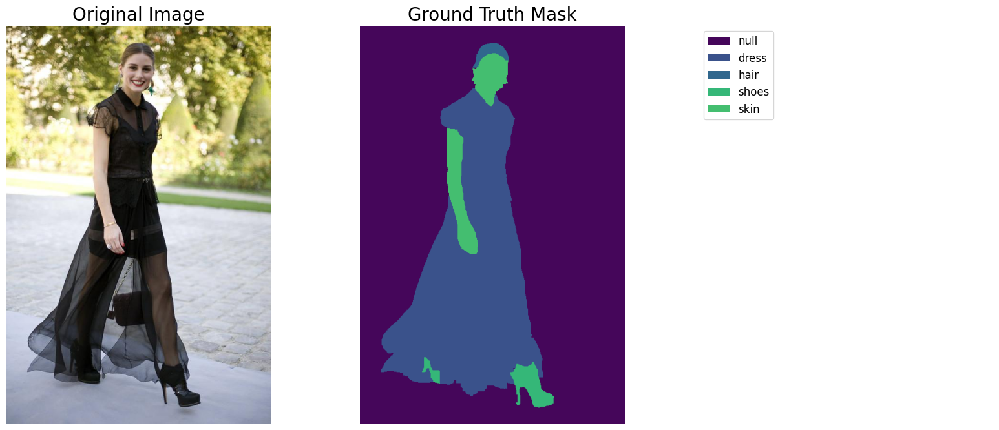

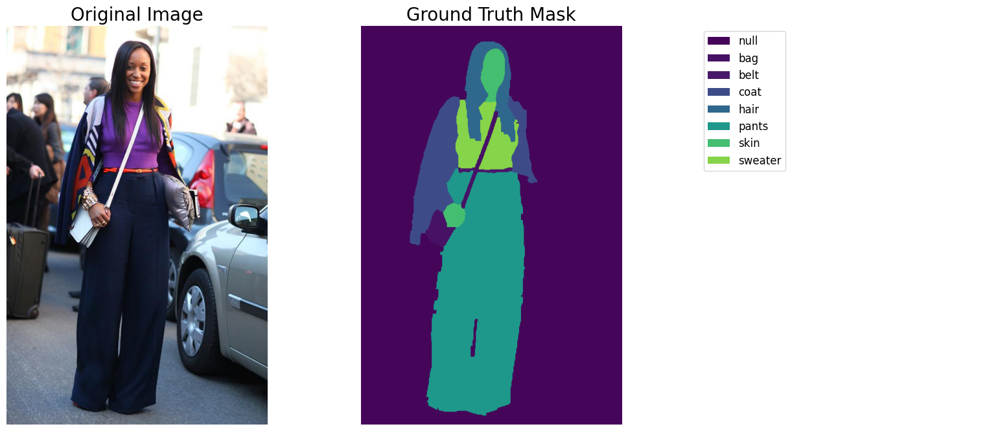

In [134]:
# Visualize the original image, gt mask, and the legend of the class category

def process_and_visualize_random_image(metadata_df, class_names, class_rgb_values, class_dict):
    # Select a random image from the dataset
    random_image_index = random.randint(0, len(metadata_df) - 1)
    random_image_row = metadata_df.iloc[random_image_index]

    # Load the selected image and its mask
    selected_image = cv2.imread(random_image_row['image_path'])[:, :, ::-1]
    selected_mask = cv2.imread(random_image_row['label_path'])[:, :, ::-1]

    # Create a dictionary to store class counts in the selected image
    class_counts = {class_name: 0 for class_name in class_names}

    # Iterate through the unique class RGB values in the mask
    unique_class_rgb_values = np.unique(selected_mask.reshape(-1, 3), axis=0)

    # Iterate through the unique class RGB values and count them as one
    for rgb_value in unique_class_rgb_values:
        rgb_value = rgb_value.tolist()
        class_name = class_names[class_rgb_values.tolist().index(rgb_value)]
        class_counts[class_name] += 1

    # Convert the class counts dictionary to a DataFrame
    img_class_counts_df = pd.DataFrame.from_dict(class_counts, orient='index', columns=['Count'])
    img_class_counts_df = img_class_counts_df[img_class_counts_df['Count'] >= 1]

    # Add RGB information from class_dict
    img_class_counts_df['r'] = img_class_counts_df.index.map(class_dict.set_index('class_name')['r'])
    img_class_counts_df['g'] = img_class_counts_df.index.map(class_dict.set_index('class_name')['g'])
    img_class_counts_df['b'] = img_class_counts_df.index.map(class_dict.set_index('class_name')['b'])

    # Reset the index
    img_class_counts_df.reset_index(inplace=True)
    img_class_counts_df.rename(columns={'index': 'class_name'}, inplace=True)

    # Create a figure with multiple subplots
    fig, axs = plt.subplots(1, 3, figsize=(20, 8))

    # Plot the original image
    axs[0].imshow(selected_image)
    axs[0].set_title("Original Image", fontsize=20)
    axs[0].axis('off')

    # Plot the ground truth mask
    axs[1].imshow(selected_mask)
    axs[1].set_title("Ground Truth Mask", fontsize=20)
    axs[1].axis('off')

    # Create a legend for class colors
    color_dict = {row['class_name']: (row['r'] / 255.0, row['g'] / 255.0, row['b'] / 255.0) for _, row in img_class_counts_df.iterrows()}
    legend_elements = [
        Patch(
            facecolor=color_dict[class_name],
            label=class_name
        )
        for class_name in img_class_counts_df['class_name']
    ]
    axs[2].legend(handles=legend_elements, loc='upper left', fontsize=12)
    axs[2].axis('off')

    plt.show()

# Visualize the original image, ground truth mask, and the legend of classes present

for _ in range(10): 
    process_and_visualize_random_image(metadata_df, class_names, class_rgb_values, class_dict)


<a name='4-3'></a>
#### 4.3 Variability of images

When training a model, it may be prone to overfitting if images in the dataset are too similar to one another. Images sometimes tend to be more zoomed in or out, focused or more blurred, how can a model know if a skirt is still a skirt if they occupy an entire image, or if a skirt only made up a small portion of an image, or when a sweater is laid flat vs when it's being worn on a person. Having a dataset that include these different variation will allow the model to generalize better and know a sweater is still a sweater when it's laid flat vs being worn.

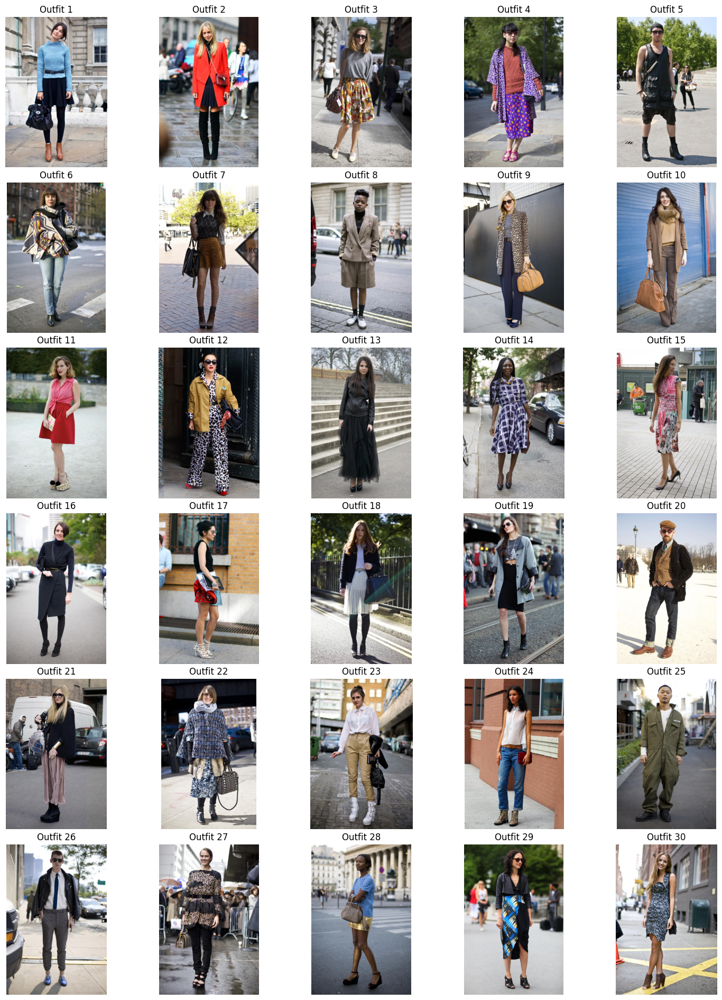

In [131]:
def visualize_images_grid_auto(images_list, titles_list, rows, cols, figsize=(18, 24)):
    """
    Visualize a grid of images automatically arranging them.

    Args:
        images_list (list): List of image arrays to be displayed.
        titles_list (list): List of titles for each image.
        rows (int): Number of rows in the grid.
        cols (int): Number of columns in the grid.
        figsize (tuple): Figure size (width, height).

    Example:
        visualize_images_grid_auto([image1, image2, image3, ...], ["Title1", "Title2", "Title3", ...], 2, 3)
    """
    total_images = len(images_list)
    if total_images != rows * cols:
        raise ValueError("The number of images should match the rows and columns specified.")

    fig, axs = plt.subplots(rows, cols, figsize=figsize)
    fig.subplots_adjust(hspace=0.1)

    for i, ax in enumerate(axs.flat):
        ax.imshow(images_list[i])
        ax.set_title(titles_list[i], fontsize=12)
        ax.axis('off')

    plt.show()

# Example usage:
# Create a list of images and titles using a for loop
images_list = []
titles_list = []

for _ in range(30):
    # Replace this with the code to select and load an image
    random_image_index = random.randint(0, len(metadata_df) - 1)
    random_image_row = metadata_df.iloc[random_image_index]
    selected_image = cv2.imread(random_image_row['image_path'])[:, :, ::-1]

    # Append the loaded image and a title to the lists
    images_list.append(selected_image)
    titles_list.append(f"Outfit {_+1}")

# Visualize images in a 6x5 grid
visualize_images_grid_auto(images_list, titles_list, rows=6, cols=5)

<a name='5.0'></a>
### 5.0 Analysis and Recommendation

<a name='5-1'></a>
#### 5.1 Class Distribution

<figure>
    <img src="./images/class-distribution.png"   style="width:500px;height:280px;" >
</figure>

The plot above shows the class distribution of the dataset, null(background), hair and skin class are the categories that dominate the dataset, with null(background), hair and skin showing up in almost every picture, at 1004, 1003, and 960 respectively. For context, there's a total of 1004 training examples.
Class items that do not appear at all in any images are panties, swimwear, intimates, and clogs.

On average, 7 class items appear in each image, not counting background(null).

On average, each class items appear in 140 images(out of 1004 images), with significantly lower median, appearing only in 57 images, compared to the top 3 categories, most items are not evenly represented in the dataset, which means that the dataset is highly imbalanced in terms of class distribution. This may make it more difficult for a model to learn the features of the less represented classes.

<a name='5-2'></a>
#### 5.2 Accuracy of Mask vs Actual Item

In this section, I'll cover a few images that have been selected randomly during data exploration, and discovered images that have been mislabeled or inconsistent labeling. Let's take a look at a few examples:

* the black shirt/top has mislabeled as a vest
* black drapy <b>vest</b> has been mislabeled as a scarf
* handled bag (masked as a purse)
<figure>
    <img src="./images/output6.png"   style="width:600px;height:280px;" >
</figure>


* <b>Inconsistent bag vs purse class labeling</b>
* take a look at the bag/purse image above and some examples below:
* It seems like most larger bags with handles are labeled as bags and clutches are mostly labeled as a purse, but in many images, a class purse is labeled as bag and vice versa, this led to inconsistent labeling and may make it harder for the model to learn understand its features

* image: handled bag (masked as bag)
<figure>
    <img src="./images/output8.png"   style="width:600px;height:280px;" >
</figure>

* image: handled bag (masked as a purse)
<figure>
    <img src="./images/output93.png"   style="width:600px;height:280px;" >
</figure>

* image: handled bag (masked as a purse)
<figure>
    <img src="./images/output94.png"   style="width:600px;height:280px;" >
</figure>

* image: clutch (masked as a bag)
<figure>
    <img src="./images/output2.png"   style="width:600px;height:280px;" >
</figure>

* image: clutch (masked as purse)
<figure>
    <img src="./images/output3.png"   style="width:600px;height:280px;" >
</figure>

* image: bag/purse or clutch (masked as accessories)
<figure>
    <img src="./images/output91.png"   style="width:600px;height:280px;" >
</figure>



* tweed <b>jacket</b> labeled as blouse
<figure>
    <img src="./images/output93.png"   style="width:600px;height:280px;" >
</figure>


* blue fur <b>coat</b> labeled as vest
* bracelets labeled as skin
<figure>
    <img src="./images/output91.png"   style="width:600px;height:280px;" >
</figure>

* boots (masked as shoes)
* note that this is not exactly mislabeled but boots are included in class_dict, hence, it will be more accurate to label the shoes as boots.
<figure>
    <img src="./images/output3.png"   style="width:600px;height:280px;" >
</figure>

* collared shirt that was underneath the outershirt was labeled as belt
* part of the jeans was labeled as null(background)
* blazer, labeled as suit
<figure>
    <img src="./images/output7.png"   style="width:600px;height:280px;" >
</figure>

<a name='5-3'></a>
#### 5.3 Variability of Images

* Almost all of the images in this dataset are of the same scale when it comes to items to image ratio, this led to similar sizing of items. This may lead to the model only knowing each class category only when it is of the same/similar size, and would fail to generalize on class items when it's more zoomed in or out. The items also tend to only occupy middle sections of the image and not on the sides.
* Less variability when it comes to image quality, images are of high resolution which is great to extract features of individual item, but may make it more difficult for the model to generalize when it sees data of different resolution.

<figure>
    <img src="./images/image-grid.png"   style="width:800px;height:1000px;" >
</figure>

<a name='5-4'></a>
#### 5.4 Recommendations

* The dataset consists of 1004 image mask pairs, which would be considered a very small dataset for training in a neural network, with imbalanced class distribution. To mitigate this issue, my recommendation would be to include more images and try to include more data on classes that's less represented in the current dataset.

* The dataset consists of inconsistent labeling on certain classes, and sometimes they're incorrect. Model trained on inconsistent and incorrect labels will lead to inconsistent and incorrect results. To minimize this issue, I would recommend implementing robust data governance for image and mask labeling, including standardized guidelines for each classes and quality control measures. Depending on the purpose of the project, this may include combining classes when one of the classes' data is extremely low, for example, wedges were present in only 2 images in the entire dataset, and since the model may have a hard time learning the features of wedges with only 2 training examples(or classes that's only present in less than x number of training examples), they may choose to either increase data on wedges class or delete the wedges class altogether (this will depend on the objective of the project, and if it's absolutely necessary to keep this class to move forward with the project), and mask the 2 wedges training examples as shoes.

* To address the challenges posed by limited variability of image data, I would recommend implementing image augmentation techniques during training, which will expose the model to a more diverse range of scenarios. This will allow the model to generalize better.